In [10]:
import glob
import json
import os
import time

import detectron2
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.config import get_cfg
from detectron2.data import build_detection_test_loader
from detectron2.modeling import build_model
from detectron2.utils.visualizer import Visualizer
import matplotlib.pyplot as plt
import numpy as np
import torch

geladas_root = os.path.dirname(os.path.dirname(os.getcwd()))
local_paths_file = os.path.join(geladas_root, 'local-paths.json')
with open(local_paths_file, "r") as json_file:
    local_paths = json.load(json_file)

import sys

sys.path.append(local_paths['overhead_functions_path'])

from detectron2_classes.DetectionDatasetMapper import DetectionDatasetMapper
from inference import register_inference_instances, draw_detections, nms_all_classes

In [2]:
# The name of the model folder you want to visualize
model_name = "males-random-plateau-LRscheduler-cropped-color-aug-new-dataloader_maxiter-2000_lr-0.0019_detectPerIm-200_minsize-0_batchsize-8"

In [3]:
# name of observation to process
observation_name = "DJI_0205"

# ---------------------------------------

frame_folders_root = os.path.join(local_paths['base_frames_folder'], observation_name)
frame_files = sorted(glob.glob(os.path.join(frame_folders_root, "*.jpg")))

print(f"Found {len(frame_files)} frames for {observation_name}.")

# Replace with however you want to choose frames
frame_inds = [100, 1000, 3000]
frame_files = [frame_files[ind] for ind in frame_inds]

Found 9022 frames for DJI_0205.


In [4]:
models_folder = os.path.join(os.path.dirname(os.getcwd()), 
                             'model-training', 'output')
yaml_file = os.path.join(models_folder, model_name, 'config.yaml')

cfg = get_cfg()

with open(yaml_file, 'r') as f:
    yaml_string = f.read()
cfg = cfg.load_cfg(yaml_string)

cfg.INPUT.CROP.ENABLED = False

weights_path = sorted(
    glob.glob(os.path.join(models_folder, model_name, 
                           "best-model-config-iter-*.pth"))
)
cfg.MODEL.WEIGHTS = weights_path[-1]
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.01

In [5]:
register_inference_instances("inference", frame_files)
mapper = DetectionDatasetMapper(cfg, is_train=False)
loader = build_detection_test_loader(cfg, "inference", mapper=mapper)

In [6]:
model = build_model(cfg)
_ = model.eval()

checkpointer = DetectionCheckpointer(model)
_ = checkpointer.load(cfg.MODEL.WEIGHTS)

In [ ]:
(255, 218, 0)

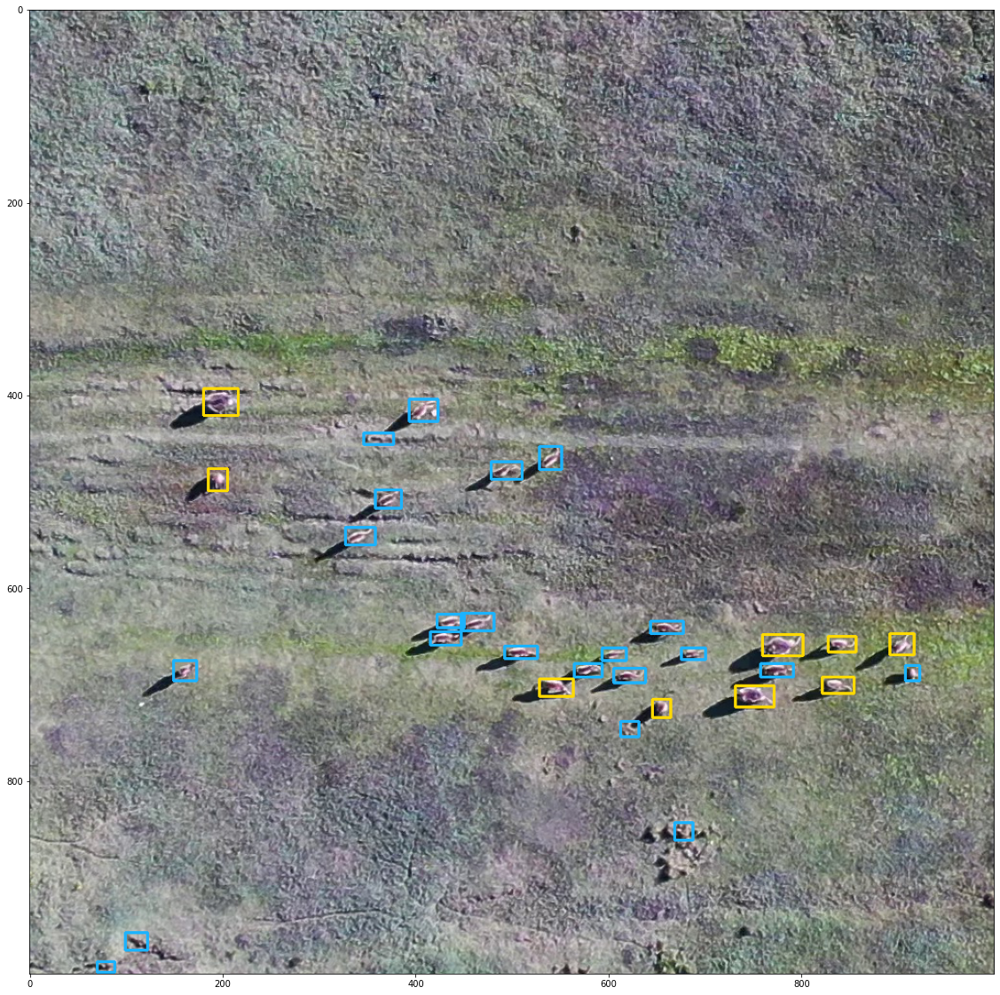

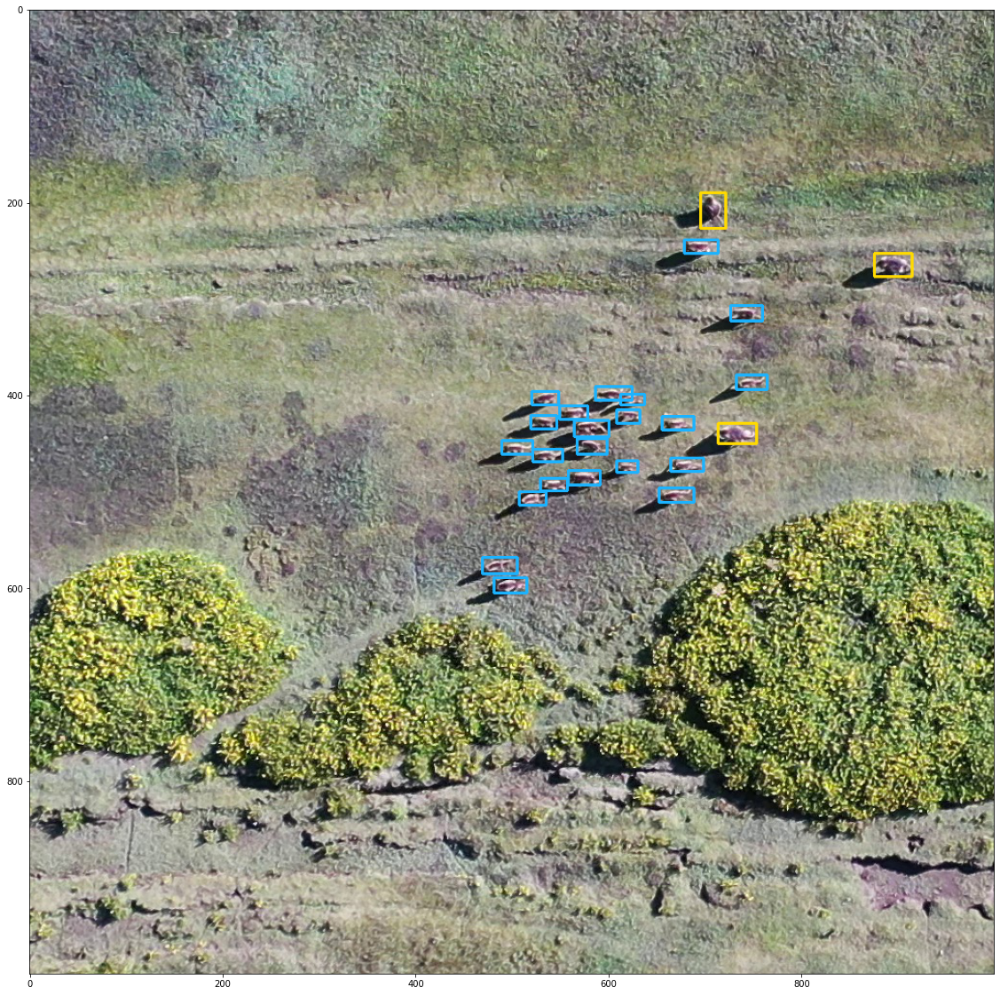

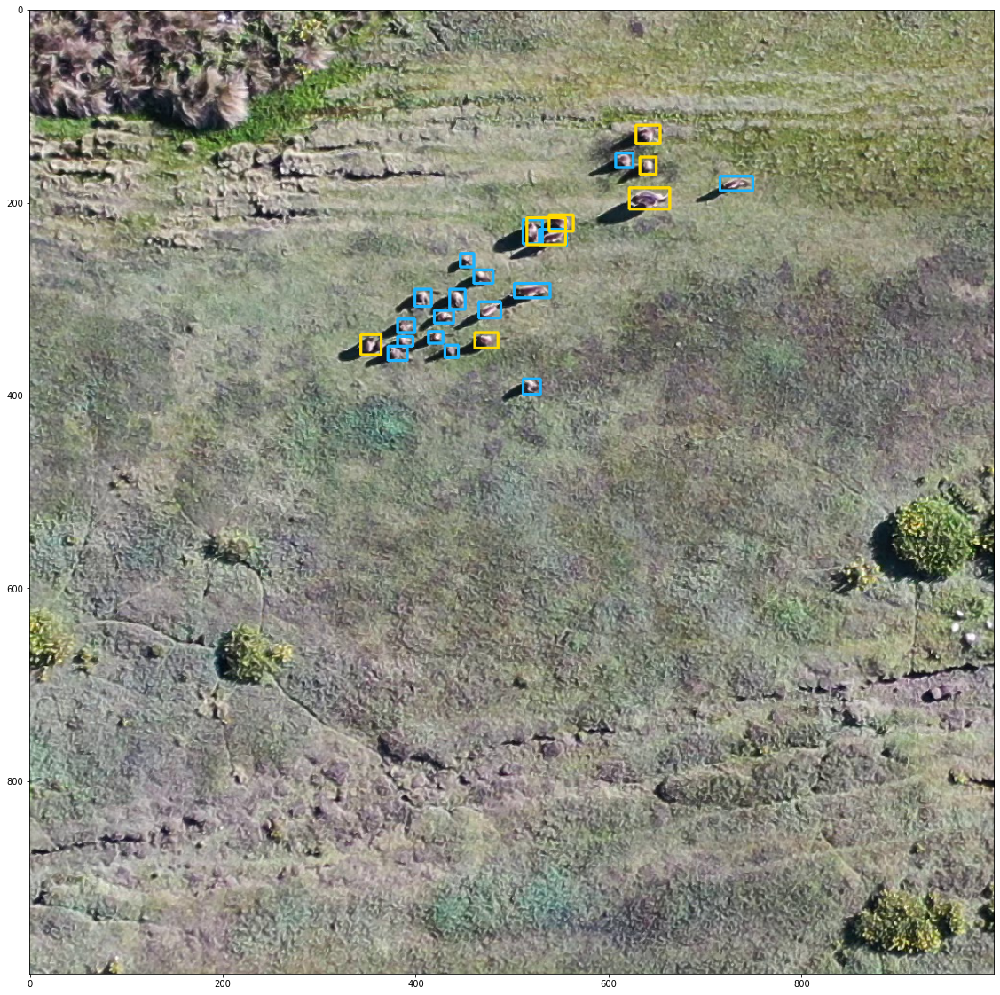

In [22]:
all_detections = []

colors = [(255, 218, 0), (27, 179, 255), (255, 255, 255)]

with torch.no_grad():
    for batch_num, image_batch in enumerate(loader):
        detections = model(image_batch)
        for detection, im in zip(detections, image_batch):
            instances = detection['instances']
            instance = nms_all_classes(instances, iou_thresh=.5)
            im = draw_detections(im, instances, min_score=.3, colors=colors, 
                                 thickness=2)
            plt.figure(figsize=(20,20))
            plt.imshow(im[500:1500, 1000:2000])

In [16]:
f

['/mount/zfs-kn/gelada_project/frames/DJI_0205/DJI_0205_000100.jpg']

In [19]:
import pickle
import os

max_batches = None

all_detections = []

t = time.time()
with torch.no_grad():
    for batch_num, image_batch in enumerate(loader):
        if max_batches:
            if batch_num >= max_batches:
                break
            
        if batch_num % 1000 == 0:
            cur_time = time.time()
            print(f"{batch_num} images processed. fps: {batch_num/(cur_time-t)}")
        detections = model(image_batch)



        detection_dict = detections[0]['instances'].get_fields()
        detection_dict['pred_boxes'] = detection_dict['pred_boxes'].tensor.cpu().numpy()
        detection_dict['scores'] = detection_dict['scores'].cpu().numpy()
        detection_dict['pred_classes'] = detection_dict['pred_classes'].cpu().numpy()
        detection_dict['image_name'] = os.path.basename(image_batch[0]['file_name'])
        all_detections.append(detection_dict)

            
print(time.time() - t)

0 images processed. fps: 0.0
0.8189849853515625


/home/golden/detectron2aug16/lib/python3.6/site-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  return x.nonzero().unbind(1)


In [13]:
frame = plt.imread(frame_files[-1])

In [ ]:
len(frame_files)

2
2
2
2
2
2
2
0.028447011
0.028422747
0.02614277
0.025905872
0.024190716
0.022830889
0.022611257
0.020198815
0.018617932
0.015947985
0.014901985
0.014740157
0.014644405
0.013069703
0.012848602
0.012522636
0.012012834


True

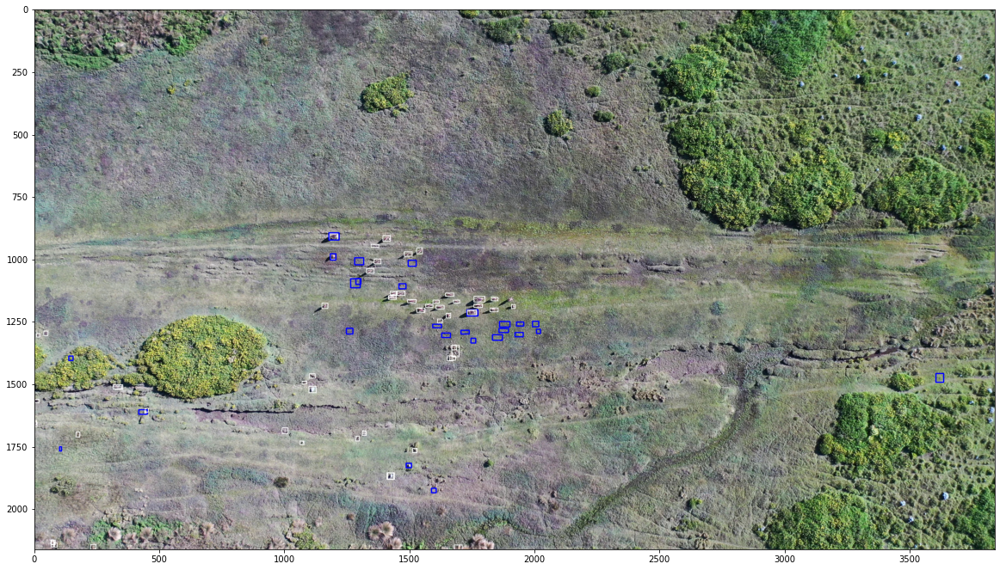

In [22]:
instances = detections[0]['instances']
frame = plt.imread(frame_files[-1])

color0 = (0, 0, 255)
color1 = (255, 193, 7)
color1 = (255, 255, 255)

for box, box_type, score in zip(instances.pred_boxes, instances.pred_classes, instances.scores):
    if score < .03:
        print(score)
        continue
    box = box.astype(np.float32)
    if box_type == 0:
        color = color0
        thickness = 3
        box += 100
    elif box_type == 1:
        color = color1
        thickness = 2
    else:
        print(box_type)
    cv2.rectangle(frame, 
                  (box[0], box[1]), (box[2], box[3]), 
                  color, thickness)
plt.figure(figsize=(20,20))
plt.imshow(frame)
filename = f"detections_{os.path.basename(frame_files[0])}"
cv2.imwrite(os.path.join(local_paths['figure_folder'], filename), frame[...,::-1])

In [15]:
instances

Instances(num_instances=31, image_height=2160, image_width=4096, fields=[pred_boxes: [[2334.0571  1093.4478  2400.9194  1142.7166 ]
 [1925.7273   954.0035  1996.5342   984.9954 ]
 [1470.5745   869.11475 1556.3457   904.69604]
 [1845.575    951.1578  1926.4592   983.6783 ]
 [2381.285    784.67426 2419.8274   874.50336]
 [3268.005   1492.9695  3316.6035  1520.7944 ]
 [ 842.1452   965.6371   919.502   1008.4392 ]
 [1244.8677   911.35376 1329.6909   949.25195]
 [1997.111   1648.3561  2054.9226  1727.1193 ]
 [3213.7925  1683.1029  3266.3286  1721.465  ]
 [3214.456   1592.8219  3259.5405  1627.3226 ]
 [3260.21    1567.4246  3310.0264  1593.665  ]
 [2597.502   1380.7084  2662.5088  1434.9796 ]
 [3258.031   1598.0487  3310.764   1630.8429 ]
 [3219.3442  1564.1534  3250.4102  1600.8851 ]
 [3248.6367  1453.194   3283.8179  1493.0214 ]
 [ 878.278    931.03186  947.0606   980.95056]
 [3091.9626  1424.8214  3135.9026  1454.6732 ]
 [2947.3494  1339.0566  3011.4465  1365.7786 ]
 [3243.446   1649.5797

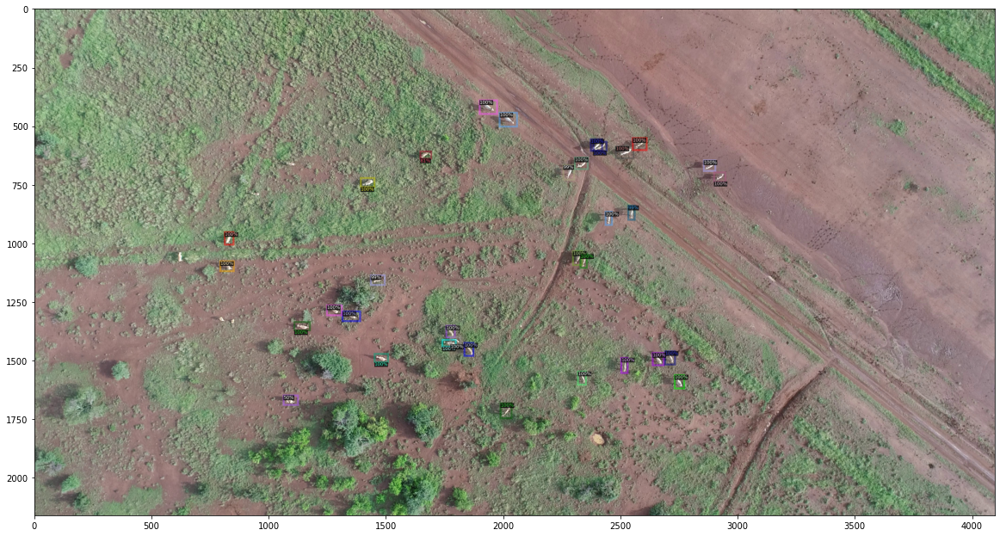

In [101]:
image = image_batch[0]['image'].numpy()
image = np.transpose(image, [1, 2, 0])

v = Visualizer(image[...,::-1],
               metadata=None,
               scale=1.0,
)
v = v.draw_instance_predictions(detections[0]['instances'])
plt.figure(figsize=(20,20))
plt.imshow(v.get_image())

In [ ]:
cfg = get_cfg()
with open(yaml_file, 'r') as f:
    yaml_string = f.read()
cfg = cfg.load_cfg(yaml_string)

cfg.SOLVER.IMS_PER_BATCH = 1
cfg.INPUT.CROP.ENABLED = False

weights_path = sorted(
    glob.glob(os.path.join(cfg.OUTPUT_DIR, "best-model-config-iter-*.pth"))
)[-1]
print(weights_path)
cfg.MODEL.WEIGHTS = os.path.join(weights_path)

In [ ]:
cfg.DATASETS.TEST = (dataset_name, )
predictor = DefaultPredictor(cfg)

for d in random.sample(val_dicts, 3):
# for d in train_dicts:
#     im = cv2.imread(d["file_name"])
    im = utils.read_image(
        d["file_name"], format=cfg.INPUT.FORMAT
    )
    outputs = predictor(im)
    v = GroundtruthVisualizer(im[:, :, ::],
                   metadata=train_metadata,
                   scale=0.8,
                   
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize=(20,20))
    plt.imshow(v.get_image()[:, :, ::-1])